In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Transforming to a 2d coordinate system
df = pd.read_csv('images/mnist.csv')
X = df.iloc[:,1:]
y = df.iloc[:,0]

In [3]:
from sklearn.model_selection import train_test_split

In [4]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2, random_state=42)

In [5]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)

In [6]:
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [7]:
X_train_trf

array([[-226.60720687,  305.89675814],
       [  38.33768263, -461.0856778 ],
       [-305.48992748, -351.67979296],
       ...,
       [ -27.99867247,  596.06723145],
       [ 233.96755029,   18.66314741],
       [1096.50386959, -254.70019332]])

In [8]:
import plotly.express as px

In [9]:
y_train_trf = y_train.astype(str)
fig = px.scatter(x=X_train_trf[:,0],
                y=X_train_trf[:,1],
                color=y_train_trf,
                color_discrete_sequence=px.colors.qualitative.G10)
fig.show()

In [10]:
# Transforming in 3D
pca = PCA(n_components=3)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [11]:
X_train_trf

array([[-226.60545421,  305.89503648,  417.1712994 ],
       [  38.33657261, -461.08895983,  100.4421302 ],
       [-305.491318  , -351.66935483, -961.3283316 ],
       ...,
       [ -28.00190811,  596.06143468,  606.25470419],
       [ 233.96992441,   18.65502488, -148.27693515],
       [1096.5042773 , -254.71034458, -560.2993294 ]])

In [12]:
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(df, x=X_train_trf[:,0], y=X_train_trf[:,1],z=X_train_trf[:,2],
                   color=y_train_trf)
fig.update_layout(
        margin=dict(l=20, r=20, t=20, b=20)
)
fig.show()

In [13]:
pca.explained_variance_
# Eigen value

array([335506.5762049 , 244807.10508639, 212051.03398324])

In [14]:
pca.components_
# Eigen vectors

array([[-2.88381081e-17,  4.10247087e-19,  3.63217217e-19, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [ 6.15091076e-17,  3.43134587e-18, -3.56044265e-18, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [-9.20105523e-19, -1.04892080e-16,  7.42978815e-17, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00]])

In [15]:
pca.components_.shape

(3, 784)

In [16]:
pca.explained_variance_ratio_*100 # convert in percentage

array([9.77072202, 7.12934512, 6.1754131 ])

In [17]:
pca = PCA(n_components=None)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [18]:
pca.explained_variance_.shape

(784,)

In [19]:
pca.components_.shape

(784, 784)

In [20]:
np.cumsum(pca.explained_variance_ratio_)

array([0.09770722, 0.16900067, 0.2307548 , 0.28465032, 0.33357585,
       0.37694429, 0.40971003, 0.43863706, 0.46634409, 0.4896358 ,
       0.51056687, 0.53103851, 0.54811645, 0.56494851, 0.58079573,
       0.59567555, 0.60890653, 0.6217459 , 0.63357974, 0.6450916 ,
       0.65585129, 0.66609344, 0.6757597 , 0.68493267, 0.69377981,
       0.70211509, 0.7102658 , 0.71801912, 0.72543898, 0.73237223,
       0.73898072, 0.74531281, 0.75134494, 0.75723224, 0.76285054,
       0.76824915, 0.77332825, 0.77819952, 0.78291205, 0.78755761,
       0.79208251, 0.7965231 , 0.80068828, 0.80464464, 0.80848068,
       0.81221196, 0.815819  , 0.81930765, 0.82264965, 0.82582976,
       0.82897181, 0.83204415, 0.83496782, 0.83783336, 0.84062454,
       0.84331783, 0.84596712, 0.84853351, 0.85106204, 0.85351457,
       0.85592008, 0.85831105, 0.86057999, 0.86279635, 0.8649424 ,
       0.86700054, 0.86901774, 0.87098082, 0.87291702, 0.87479944,
       0.87665559, 0.87847316, 0.88022525, 0.88195105, 0.88360

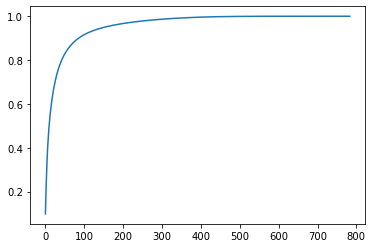

In [21]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))